In [ ]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Embedding, Bidirectional, GRU, Dense, Dropout, Concatenate
from sklearn.preprocessing import LabelEncoder

import re
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils.class_weight import compute_class_weight  # Added this import
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Embedding, Bidirectional, GRU, Dense, Dropout, Concatenate
import matplotlib.pyplot as plt

In [ ]:
import pandas as pd

df=pd.read_csv("/content/final_mapped_categories.csv")
df

,Recipe URL,Recipe name,Preparation time,Servings,List of ingredients,List of instructions,Category,Region/Cuisine,Calories_Per_Serving,Broad_Category
0,https://www.food.com/recipe/cheesy-grits-casse...,cheesy grits casserole,65.0,6.0,4cupswater 1teaspoonsalt 1cupquickcooking grit...,heat water and salt to boiling gradually add g...,oven,Unknown,493.0,Bread
1,https://www.food.com/recipe/crock-pot-beer-bra...,crock pot beer brats,440.0,4.0,8bratwursts 2tablespoonsolive oil 2garlic clov...,heat oil and garlic in a large skillet add bra...,pork,Unknown,493.0,Meat/Poultry
2,https://www.food.com/recipe/banana-bread-with-...,banana bread with coconut milk,40.0,10.0,4ripe mashedbananas 712ounces canscoconut milk...,mix wet ingredients and dry ingredients mixtur...,quick breads,Unknown,493.0,Bread
3,https://www.food.com/recipe/pasta-salad-suprem...,pasta salad supreme,25.0,6.0,16ouncesrotini pastaor 16 ouncesshell pastasom...,cook pasta rinse under cold water and drain we...,vegetable,Unknown,493.0,Vegetable
4,https://www.food.com/recipe/bread-machine-monk...,bread machine monkey pull aparts,70.0,11.0,112teaspoonsactive dry yeast 114cupsbread flou...,add ingredients to your bread maker according ...,breads,Unknown,493.0,Bread
...,...,...,...,...,...,...,...,...,...,...
50007,https://www.thespruceeats.com/fresh-cherry-cob...,fresh cherry cobbler,40.0,8.0,for the cherries 1 14 cups sugar 3 tablespoons...,gather the ingredients heat the oven to 400 f ...,dessert,southern,493.0,Dessert
50008,https://www.thespruceeats.com/easy-cherry-dess...,easy cherry dessert recipe,75.0,8.0,1 cup graham cracker crumbs 1 cup allpurpose f...,butter a 9inch square baking pan or spray with...,dessert,southern,493.0,Dessert
50009,https://www.thespruceeats.com/semi-homemade-ch...,semihomemade cherry cake,45.0,8.0,cooking spray allpurpose flour for the pan 1 1...,heat the oven to 350 f grease and flour a 9by1...,dessert,southern,493.0,Dessert
50010,https://www.thespruceeats.com/cherry-crumb-bar...,cherry pie bars recipe,65.0,8.0,1 cup 8ounces softened unsalted butter more fo...,gather the ingredients grease a 10x15x1inch ba...,pies dessert,southern,493.0,Dessert


In [ ]:
category_counts = df['Broad_Category'].value_counts()

print("Total unique categories:", category_counts.shape[0])
print("\nCategory counts:\n")
for category, count in category_counts.items():
    print(f"- {category}: {count}")


Total unique categories: 20

Category counts:

- Dessert: 7430
- Dinner: 6647
- Lunch: 4729
- Side Dish: 3860
- Snack: 3815
- Meat/Poultry: 3290
- Vegetable: 3155
- Breakfast: 2971
- Bread: 2837
- Other: 2359
- Appetizer: 1803
- Beverage: 1570
- Party: 1426
- Salad: 956
- Sauce/Condiment: 786
- Soup/Stew: 626
- Pasta/Rice: 602
- Cake/Pie: 510
- Main Course: 391
- Healthy: 249


Using GRU Model


In [ ]:
import re
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Embedding, Bidirectional, GRU, Dense, Dropout, Concatenate
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.mixed_precision import set_global_policy
from sklearn.preprocessing import LabelEncoder
from sklearn.utils.class_weight import compute_class_weight
from sklearn.model_selection import train_test_split

# ✅ Disable mixed precision temporarily (to check if it causes issues)
# set_global_policy('mixed_float16')

df = pd.read_csv("/content/final_mapped_categories.csv")

# ✅ Text cleaning function
def clean_instruction(text):
    if pd.isna(text) or text.strip() == "":
        return None
    if re.fullmatch(r'[\d\s]+', str(text)):  # Remove rows with only numbers
        return None
    text = re.sub(r'[^\w\s°]', ' ', str(text))  # Keep ° for temperatures
    text = re.sub(r'\s+', ' ', text).strip()    # Collapse spaces
    return text if text else None

# ✅ Load dataset (assuming df is already loaded)
df['cleaned_instructions'] = df['List of instructions'].apply(clean_instruction)
df = df.dropna(subset=['cleaned_instructions'])

# ✅ Tokenization and padding
tokenizer = Tokenizer(num_words=12000, oov_token='<OOV>')
tokenizer.fit_on_texts(df['cleaned_instructions'])
sequences = tokenizer.texts_to_sequences(df['cleaned_instructions'])
padded_sequences = pad_sequences(sequences, maxlen=200, padding='post', truncating='post')

# ✅ Label encoding
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(df['Broad_Category'])
num_classes = len(label_encoder.classes_)

# ✅ Compute class weights
class_weights = compute_class_weight('balanced', classes=np.unique(y), y=y)
class_weight_dict = {cls: weight for cls, weight in zip(np.unique(y), class_weights)}

# ✅ Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    padded_sequences, y, test_size=0.2, random_state=42, stratify=y
)

# ✅ Convert to int32 for TensorFlow compatibility
X_train = np.array(X_train, dtype=np.int32)
X_test = np.array(X_test, dtype=np.int32)
y_train = np.array(y_train, dtype=np.int32)
y_test = np.array(y_test, dtype=np.int32)

# ✅ Model architecture
input_layer = Input(shape=(200,), dtype=tf.int32)

# Branch 1
embedding1 = Embedding(12000, 96)(input_layer)
dropout1 = Dropout(0.4)(embedding1)
bigru1 = Bidirectional(GRU(48, return_sequences=True))(dropout1)
bigru2 = Bidirectional(GRU(48))(bigru1)
dense1 = Dense(64, activation='relu')(bigru2)

# Branch 2
embedding2 = Embedding(12000, 96)(input_layer)
dropout2 = Dropout(0.4)(embedding2)
bigru3 = Bidirectional(GRU(48, return_sequences=True))(dropout2)
bigru4 = Bidirectional(GRU(48))(bigru3)
dense2 = Dense(64, activation='relu')(bigru4)

# ✅ Merge layers and ensure dtype=float32 in the final output
merged = Concatenate()([dense1, dense2])
output = Dense(num_classes, activation='softmax', dtype='float32')(merged)

# ✅ Model creation
model = Model(inputs=input_layer, outputs=output)

# ✅ Optimizer with correct dtype
optimizer = Adam(learning_rate=0.0005)

# ✅ Compile with proper dtype handling
model.compile(
    optimizer=optimizer,
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# ✅ Early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(
    patience=3,
    restore_best_weights=True
)

# ✅ Training (with correct class weights)
history = model.fit(
    X_train, y_train,
    epochs=10,
    batch_size=64,
    validation_data=(X_test, y_test),
    callbacks=[early_stopping],
    class_weight=class_weight_dict,
    verbose=1
)


Epoch 1/10
593/593 ━━━━━━━━━━━━━━━━━━━━ 1735s 3s/step - accuracy: 0.1129 - loss: 2.6645 - val_accuracy: 0.2884 - val_loss: 2.1840
Epoch 2/10
593/593 ━━━━━━━━━━━━━━━━━━━━ 1709s 3s/step - accuracy: 0.3096 - loss: 1.9565 - val_accuracy: 0.3251 - val_loss: 2.0312
Epoch 3/10
593/593 ━━━━━━━━━━━━━━━━━━━━ 1756s 3s/step - accuracy: 0.3745 - loss: 1.7160 - val_accuracy: 0.3667 - val_loss: 1.9225
Epoch 4/10
593/593 ━━━━━━━━━━━━━━━━━━━━ 1675s 3s/step - accuracy: 0.4301 - loss: 1.5154 - val_accuracy: 0.3824 - val_loss: 1.9253
Epoch 5/10
593/593 ━━━━━━━━━━━━━━━━━━━━ 1731s 3s/step - accuracy: 0.4715 - loss: 1.3724 - val_accuracy: 0.4380 - val_loss: 1.7734
Epoch 6/10
123/593 ━━━━━━━━━━━━━━━━━━━━ 20:31 3s/step - accuracy: 0.5103 - loss: 1.2300

In [ ]:
import re
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Model
from tensorflow.keras.layers import (
    Input, Embedding, Bidirectional, GRU, Dense, Dropout,
    Concatenate, Conv1D, GlobalMaxPooling1D, SpatialDropout1D
)
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import LabelEncoder
from sklearn.utils.class_weight import compute_class_weight
from sklearn.model_selection import train_test_split

# Load the data
df = pd.read_csv("/content/final_mapped_categories.csv")

# Clean instruction text
def clean_instruction(text):
    if pd.isna(text) or text.strip() == "":
        return None
    if re.fullmatch(r'[\d\s]+', str(text)):
        return None
    text = re.sub(r'[^\w\s°]', ' ', str(text))  # Keep ° for temperature
    text = re.sub(r'\s+', ' ', text).strip()
    return text if text else None

# Apply cleaning
df['cleaned_instructions'] = df['List of instructions'].apply(clean_instruction)
df = df.dropna(subset=['cleaned_instructions'])

# Tokenize text
tokenizer = Tokenizer(num_words=12000, oov_token='<OOV>')
tokenizer.fit_on_texts(df['cleaned_instructions'])
sequences = tokenizer.texts_to_sequences(df['cleaned_instructions'])
padded_sequences = pad_sequences(sequences, maxlen=200, padding='post', truncating='post')

# Encode labels
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(df['Broad_Category'])
num_classes = len(label_encoder.classes_)

# Compute class weights
class_weights = compute_class_weight('balanced', classes=np.unique(y), y=y)
class_weight_dict = {cls: weight for cls, weight in zip(np.unique(y), class_weights)}

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    padded_sequences, y, test_size=0.2, random_state=42, stratify=y
)

X_train = np.array(X_train, dtype=np.int32)
X_test = np.array(X_test, dtype=np.int32)
y_train = np.array(y_train, dtype=np.int32)
y_test = np.array(y_test, dtype=np.int32)

# Model architecture (CNN + BiGRU Hybrid)
input_layer = Input(shape=(200,), dtype=tf.int32)
embedding_layer = Embedding(input_dim=12000, output_dim=96)(input_layer)
spatial_dropout = SpatialDropout1D(0.3)(embedding_layer)

# CNN branch
conv = Conv1D(64, kernel_size=3, activation='relu')(spatial_dropout)
pool = GlobalMaxPooling1D()(conv)

# BiGRU branch
bigru = Bidirectional(GRU(64, return_sequences=True))(spatial_dropout)
bigru_out = GlobalMaxPooling1D()(bigru)

# Merge branches
merged = Concatenate()([pool, bigru_out])
dense = Dense(128, activation='relu')(merged)
drop = Dropout(0.5)(dense)
output = Dense(num_classes, activation='softmax')(drop)

# Model compile
model = Model(inputs=input_layer, outputs=output)
model.compile(
    optimizer=Adam(learning_rate=0.0005),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# Early stopping
early_stopping = tf.keras.callbacks.EarlyStopping(
    patience=3, restore_best_weights=True
)

# Train model
history = model.fit(
    X_train, y_train,
    epochs=30,
    batch_size=64,
    validation_data=(X_test, y_test),
    callbacks=[early_stopping],
    class_weight=class_weight_dict,
    verbose=1
)

Epoch 1/30
593/593 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - accuracy: 0.1073 - loss: 2.8738 - val_accuracy: 0.3160 - val_loss: 2.1834
Epoch 2/30
593/593 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - accuracy: 0.2760 - loss: 2.1587 - val_accuracy: 0.3747 - val_loss: 1.9468
Epoch 3/30
593/593 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - accuracy: 0.3593 - loss: 1.8801 - val_accuracy: 0.4055 - val_loss: 1.8342
Epoch 4/30
593/593 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - accuracy: 0.4127 - loss: 1.6754 - val_accuracy: 0.4342 - val_loss: 1.7515
Epoch 5/30
593/593 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - accuracy: 0.4398 - loss: 1.5331 - val_accuracy: 0.4495 - val_loss: 1.6963
Epoch 6/30
593/593 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - accuracy: 0.4633 - loss: 1.4319 - val_accuracy: 0.4695 - val_loss: 1.6580
Epoch 7/30
593/593 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - accuracy: 0.4848 - loss: 1.3315 - val_accuracy: 0.4700 - val_loss: 1.6501
Epoch 8/30
593/593 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - accuracy: 0.5083 - loss: 1.2564 - 

In [ ]:
import re
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Model
from tensorflow.keras.layers import (
    Input, Embedding, Bidirectional, GRU, Dense, Dropout,
    Concatenate, Conv1D, GlobalMaxPooling1D, SpatialDropout1D,
    BatchNormalization, MultiHeadAttention, LayerNormalization
)
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.preprocessing import LabelEncoder
from sklearn.utils.class_weight import compute_class_weight
from sklearn.model_selection import train_test_split

# Load and preprocess data
def load_and_preprocess_data(filepath):
    df = pd.read_csv(filepath)

    # Enhanced cleaning with cooking-specific normalization
    def clean_instruction(text):
        if pd.isna(text) or text.strip() == "":
            return None

        # Standardize cooking terms
        text = re.sub(r'(\d+)\s*°\s*[Ff]', 'TEMP_\\1', str(text))  # Temperatures
        text = re.sub(r'(\d+)\s*(tbsp|tablespoon)', 'TBSP_\\1', text)  # Measurements
        text = re.sub(r'(\d+)\s*(tsp|teaspoon)', 'TSP_\\1', text)
        text = re.sub(r'(\d+)\s*(cup|cups)', 'CUP_\\1', text)

        # Remove special chars but keep basic punctuation
        text = re.sub(r'[^\w\s.,;!°]', ' ', text)
        text = re.sub(r'\s+', ' ', text).strip()
        return text if text else None

    df['cleaned_instructions'] = df['List of instructions'].apply(clean_instruction)
    df = df.dropna(subset=['cleaned_instructions'])

    # Add instruction length as feature
    df['instruction_length'] = df['cleaned_instructions'].apply(lambda x: len(x.split()))

    return df

df = load_and_preprocess_data("/content/final_mapped_categories.csv")

# Tokenization with enhanced settings
tokenizer = Tokenizer(num_words=15000, oov_token='<OOV>', filters='', lower=False)
tokenizer.fit_on_texts(df['cleaned_instructions'])
sequences = tokenizer.texts_to_sequences(df['cleaned_instructions'])

# Dynamic padding length based on 95th percentile
seq_lengths = [len(seq) for seq in sequences]
max_len = int(np.percentile(seq_lengths, 95))
padded_sequences = pad_sequences(sequences, maxlen=max_len, padding='post', truncating='post')

# Prepare features and labels
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(df['Broad_Category'])
num_classes = len(label_encoder.classes_)

# Normalize length features
length_features = df['instruction_length'].values.reshape(-1, 1)
length_features = (length_features - length_features.mean()) / length_features.std()

# Train-test split with indices to maintain alignment
indices = np.arange(len(df))
X_train_seq, X_test_seq, X_train_len, X_test_len, y_train, y_test = train_test_split(
    padded_sequences, length_features, y,
    test_size=0.2, random_state=42, stratify=y
)

# Enhanced Hybrid Model Architecture
def build_hybrid_model(vocab_size, max_len, num_classes):
    # Text sequence input
    sequence_input = Input(shape=(max_len,), name='sequence_input')

    # Enhanced embedding layer
    embedding = Embedding(
        input_dim=vocab_size,
        output_dim=192,
        input_length=max_len,
        mask_zero=True,
        name='embedding'
    )(sequence_input)

    # Spatial dropout
    x = SpatialDropout1D(0.4)(embedding)

    # BiGRU branch with attention
    gru_out = Bidirectional(GRU(96, return_sequences=True))(x)
    attention = MultiHeadAttention(num_heads=4, key_dim=64)(gru_out, gru_out)
    gru_att = LayerNormalization()(gru_out + attention)  # Residual connection
    gru_pool = GlobalMaxPooling1D()(gru_att)

    # CNN branch with multiple kernel sizes
    conv1 = Conv1D(96, kernel_size=2, activation='relu', padding='same')(x)
    conv2 = Conv1D(96, kernel_size=3, activation='relu', padding='same')(x)
    conv3 = Conv1D(96, kernel_size=5, activation='relu', padding='same')(x)
    conv_merged = Concatenate()([conv1, conv2, conv3])
    conv_pool = GlobalMaxPooling1D()(conv_merged)

    # Length feature input
    length_input = Input(shape=(1,), name='length_input')
    dense_feat = Dense(32, activation='relu')(length_input)

    # Merge all branches
    merged = Concatenate()([gru_pool, conv_pool, dense_feat])
    merged = BatchNormalization()(merged)

    # Deep dense layers with regularization
    x = Dense(256, activation='relu', kernel_regularizer=l2(0.001))(merged)
    x = Dropout(0.5)(x)
    x = Dense(128, activation='relu', kernel_regularizer=l2(0.001))(x)
    x = Dropout(0.4)(x)

    # Output layer
    output = Dense(num_classes, activation='softmax')(x)

    # Final model
    model = Model(inputs=[sequence_input, length_input], outputs=output)

    # Custom optimizer with weight decay
    optimizer = Adam(
        learning_rate=0.0005,
        beta_1=0.9,
        beta_2=0.999,
        epsilon=1e-7,
        weight_decay=0.0001
    )

    model.compile(
        optimizer=optimizer,
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )

    return model

# Build and train model
model = build_hybrid_model(
    vocab_size=15000,
    max_len=max_len,
    num_classes=num_classes
)

# Class weights
class_weights = compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)
class_weight_dict = {i: weight for i, weight in enumerate(class_weights)}

# Callbacks
callbacks = [
    EarlyStopping(monitor='val_accuracy', patience=5, restore_best_weights=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, min_lr=1e-6)
]

# Train
history = model.fit(
    x={'sequence_input': X_train_seq, 'length_input': X_train_len},
    y=y_train,
    epochs=30,
    batch_size=128,
    validation_data=(
        {'sequence_input': X_test_seq, 'length_input': X_test_len},
        y_test
    ),
    callbacks=callbacks,
    class_weight=class_weight_dict,
    verbose=1
)

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


Epoch 1/30


/usr/local/lib/python3.11/dist-packages/keras/src/layers/layer.py:938: UserWarning: Layer 'conv1d' (of type Conv1D) was passed an input with a mask attached to it. However, this layer does not support masking and will therefore destroy the mask information. Downstream layers will not see the mask.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/keras/src/layers/layer.py:938: UserWarning: Layer 'conv1d_1' (of type Conv1D) was passed an input with a mask attached to it. However, this layer does not support masking and will therefore destroy the mask information. Downstream layers will not see the mask.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/keras/src/layers/layer.py:938: UserWarning: Layer 'conv1d_2' (of type Conv1D) was passed an input with a mask attached to it. However, this layer does not support masking and will therefore destroy the mask information. Downstream layers will not see the mask.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/keras/sr

304/304 ━━━━━━━━━━━━━━━━━━━━ 50s 130ms/step - accuracy: 0.0955 - loss: 3.4671 - val_accuracy: 0.2081 - val_loss: 2.9161 - learning_rate: 5.0000e-04
Epoch 2/30
304/304 ━━━━━━━━━━━━━━━━━━━━ 78s 128ms/step - accuracy: 0.2133 - loss: 2.7066 - val_accuracy: 0.2896 - val_loss: 2.5179 - learning_rate: 5.0000e-04
Epoch 3/30
304/304 ━━━━━━━━━━━━━━━━━━━━ 41s 127ms/step - accuracy: 0.2985 - loss: 2.3787 - val_accuracy: 0.3655 - val_loss: 2.3383 - learning_rate: 5.0000e-04
Epoch 4/30
304/304 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - accuracy: 0.3511 - loss: 2.1559 - val_accuracy: 0.3985 - val_loss: 2.1313 - learning_rate: 5.0000e-04
Epoch 5/30
304/304 ━━━━━━━━━━━━━━━━━━━━ 39s 127ms/step - accuracy: 0.3937 - loss: 1.9759 - val_accuracy: 0.4389 - val_loss: 2.0205 - learning_rate: 5.0000e-04
Epoch 6/30
304/304 ━━━━━━━━━━━━━━━━━━━━ 39s 120ms/step - accuracy: 0.4295 - loss: 1.8130 - val_accuracy: 0.4427 - val_loss: 2.0110 - learning_rate: 5.0000e-04
Epoch 7/30
304/304 ━━━━━━━━━━━━━━━━━━━━ 43s 128ms/step - 

In [ ]:
from sklearn.metrics import classification_report

y_pred = model.predict({'sequence_input': X_test_seq, 'length_input': X_test_len})
y_pred_classes = np.argmax(y_pred, axis=1)

print(classification_report(
    y_test,
    y_pred_classes,
    target_names=label_encoder.classes_,
    digits=3
))

304/304 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step
                 precision    recall  f1-score   support

      Appetizer      0.319     0.562     0.407       333
       Beverage      0.757     0.789     0.773       280
          Bread      0.732     0.745     0.738       538
      Breakfast      0.560     0.686     0.617       576
       Cake/Pie      0.468     0.667     0.550        99
        Dessert      0.856     0.792     0.823      1440
         Dinner      0.684     0.399     0.504      1284
        Healthy      0.380     0.380     0.380        50
          Lunch      0.520     0.184     0.272       934
    Main Course      0.125     0.615     0.208        78
   Meat/Poultry      0.601     0.740     0.663       658
          Other      0.255     0.059     0.095       444
          Party      0.254     0.888     0.395       285
     Pasta/Rice      0.391     0.658     0.491       120
          Salad      0.237     0.495     0.320       188
Sauce/Condiment      0.335     0.510     0.40

304/304 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step


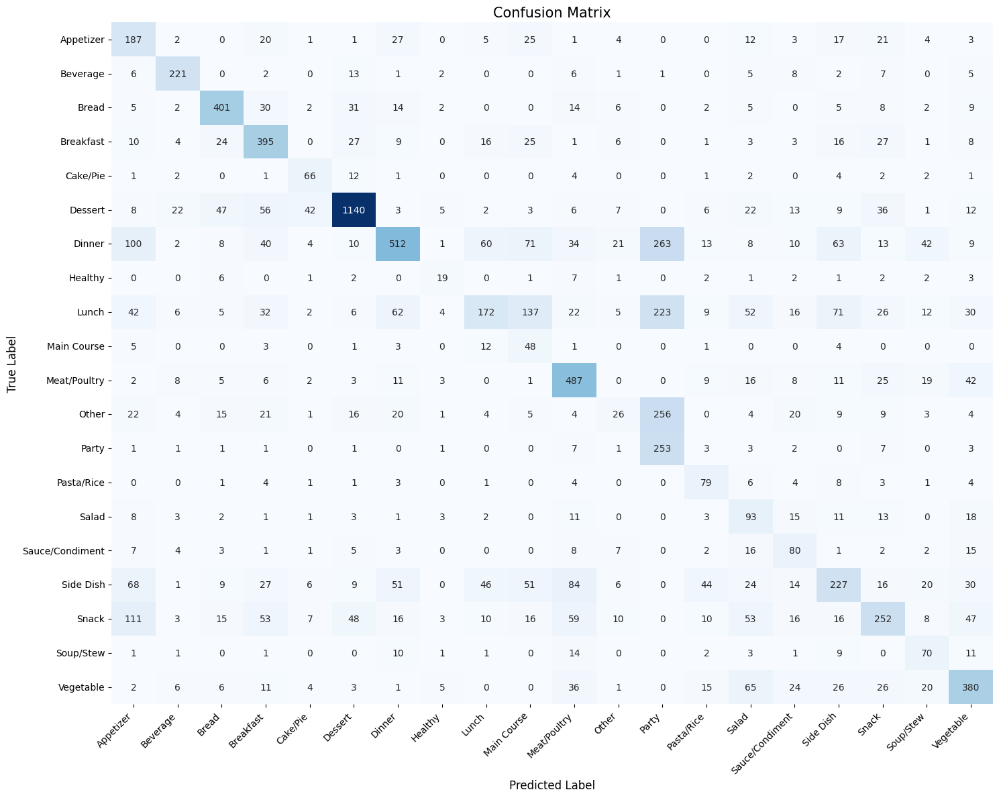

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Generate predictions
y_pred = model.predict({'sequence_input': X_test_seq, 'length_input': X_test_len})
y_pred_classes = np.argmax(y_pred, axis=1)

# Create confusion matrix
cm = confusion_matrix(y_test, y_pred_classes)

# Plot with corrected class labels
plt.figure(figsize=(15, 12))
sns.heatmap(cm,
            annot=True,
            fmt='d',  # Integer format
            xticklabels=label_encoder.classes_,  # Removed ()
            yticklabels=label_encoder.classes_,  # Removed ()
            cmap='Blues',
            cbar=False)
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('True Label', fontsize=12)
plt.title('Confusion Matrix', fontsize=15)
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.show()

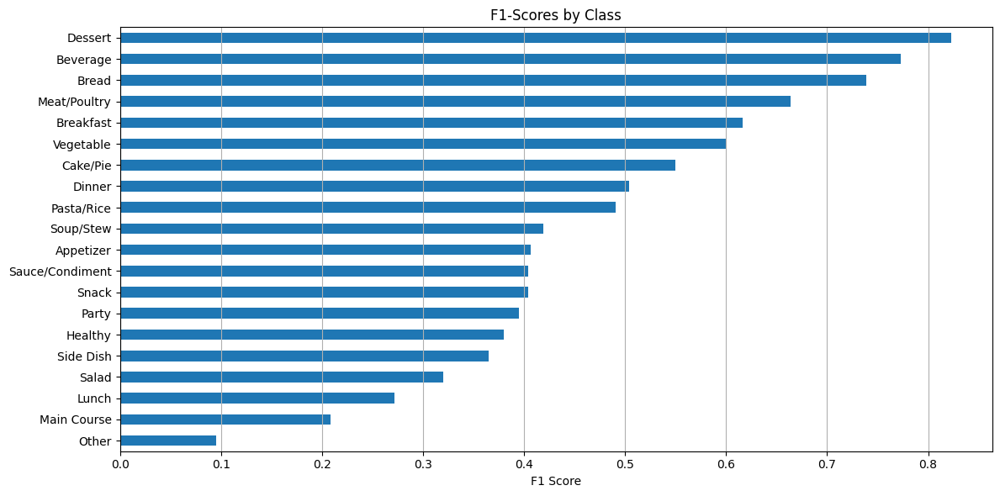

In [ ]:
metrics = classification_report(y_test, y_pred_classes,
                               target_names=label_encoder.classes_,
                               output_dict=True)
class_metrics = pd.DataFrame(metrics).transpose().iloc[:-3, :]

# Plot F1-scores
plt.figure(figsize=(12, 6))
class_metrics['f1-score'].sort_values().plot(kind='barh')
plt.title('F1-Scores by Class')
plt.xlabel('F1 Score')
plt.grid(axis='x')
plt.tight_layout()
plt.show()

Using LSTM Model


In [ ]:
import re
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Model
from tensorflow.keras.layers import (Input, Embedding, Bidirectional, GRU, LSTM, Dense,
                                   Dropout, Concatenate, Conv1D, GlobalMaxPooling1D,
                                   SpatialDropout1D, MultiHeadAttention, LayerNormalization,
                                   Flatten, BatchNormalization)
from tensorflow.keras.optimizers import Adam, RMSprop
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.preprocessing import LabelEncoder
from sklearn.utils.class_weight import compute_class_weight
from sklearn.model_selection import train_test_split
import nltk
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
nltk.download(['punkt', 'wordnet', 'stopwords'])
nltk.download('punkt_tab')
# Custom preprocessing functions
def preprocess_recipe_text(text):
    """Enhanced text preprocessing for recipes"""
    if pd.isna(text) or text.strip() == "":
        return None

    # Standardize measurements and temperatures
    text = re.sub(r'(\d+)\s*°\s*[Ff]', ' TEMP_\\1 ', text)  # 350°F → TEMP_350
    text = re.sub(r'(\d+)\s*degrees?\s*[Ff]', ' TEMP_\\1 ', text)
    text = re.sub(r'(\d+)\s*(tbsp|tablespoon)', ' TBSP_\\1 ', text)
    text = re.sub(r'(\d+)\s*(tsp|teaspoon)', ' TSP_\\1 ', text)
    text = re.sub(r'(\d+)\s*(cup|cups)', ' CUP_\\1 ', text)

    # Special handling for fractions
    text = re.sub(r'(\d+)\s*/\s*(\d+)', 'FRAC_\\1_\\2', text)

    # Remove special chars but keep basic punctuation
    text = re.sub(r'[^\w\s.,;!?°]', ' ', text)

    # Lemmatization with focus on cooking verbs
    lemmatizer = WordNetLemmatizer()
    tokens = word_tokenize(text.lower())

    # Custom cooking verb lemmatization
    cooking_verbs = {
        'chopped': 'chop', 'minced': 'mince', 'diced': 'dice',
        'sliced': 'slice', 'grated': 'grate', 'peeled': 'peel',
        'whisked': 'whisk', 'beaten': 'beat', 'stirred': 'stir',
        'simmered': 'simmer', 'boiled': 'boil', 'fried': 'fry',
        'baked': 'bake', 'roasted': 'roast', 'grilled': 'grill'
    }

    processed_tokens = []
    for token in tokens:
        if token in cooking_verbs:
            processed_tokens.append(cooking_verbs[token])
        else:
            processed_tokens.append(lemmatizer.lemmatize(token))

    # Remove stopwords but keep cooking-related ones
    stop_words = set(stopwords.words('english'))
    cooking_stopwords = {'until', 'into', 'over', 'off', 'while', 'when'}
    stop_words -= cooking_stopwords

    filtered_tokens = [word for word in processed_tokens if word not in stop_words]

    return ' '.join(filtered_tokens)

# Load and preprocess data
df = pd.read_csv("/content/final_mapped_categories.csv")
df['cleaned_instructions'] = df['List of instructions'].apply(preprocess_recipe_text)
df = df.dropna(subset=['cleaned_instructions'])

# Add length features
df['instruction_length'] = df['cleaned_instructions'].apply(lambda x: len(x.split()))

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


In [ ]:
df

,Recipe URL,Recipe name,Preparation time,Servings,List of ingredients,List of instructions,Category,Region/Cuisine,Calories_Per_Serving,Broad_Category,cleaned_instructions,instruction_length
0,https://www.food.com/recipe/cheesy-grits-casse...,cheesy grits casserole,65.0,6.0,4cupswater 1teaspoonsalt 1cupquickcooking grit...,heat water and salt to boiling gradually add g...,oven,Unknown,493.0,Bread,heat water salt boiling gradually add grit ret...,39
1,https://www.food.com/recipe/crock-pot-beer-bra...,crock pot beer brats,440.0,4.0,8bratwursts 2tablespoonsolive oil 2garlic clov...,heat oil and garlic in a large skillet add bra...,pork,Unknown,493.0,Meat/Poultry,heat oil garlic large skillet add bratwurst br...,27
2,https://www.food.com/recipe/banana-bread-with-...,banana bread with coconut milk,40.0,10.0,4ripe mashedbananas 712ounces canscoconut milk...,mix wet ingredients and dry ingredients mixtur...,quick breads,Unknown,493.0,Bread,mix wet ingredient dry ingredient mixture lump...,25
3,https://www.food.com/recipe/pasta-salad-suprem...,pasta salad supreme,25.0,6.0,16ouncesrotini pastaor 16 ouncesshell pastasom...,cook pasta rinse under cold water and drain we...,vegetable,Unknown,493.0,Vegetable,cook pasta rinse cold water drain well place p...,33
4,https://www.food.com/recipe/bread-machine-monk...,bread machine monkey pull aparts,70.0,11.0,112teaspoonsactive dry yeast 114cupsbread flou...,add ingredients to your bread maker according ...,breads,Unknown,493.0,Bread,add ingredient bread maker according manufactu...,70
...,...,...,...,...,...,...,...,...,...,...,...,...
50007,https://www.thespruceeats.com/fresh-cherry-cob...,fresh cherry cobbler,40.0,8.0,for the cherries 1 14 cups sugar 3 tablespoons...,gather the ingredients heat the oven to 400 f ...,dessert,southern,493.0,Dessert,gather ingredient heat oven 400 f medium sauce...,42
50008,https://www.thespruceeats.com/easy-cherry-dess...,easy cherry dessert recipe,75.0,8.0,1 cup graham cracker crumbs 1 cup allpurpose f...,butter a 9inch square baking pan or spray with...,dessert,southern,493.0,Dessert,butter 9inch square baking pan spray baking sp...,88
50009,https://www.thespruceeats.com/semi-homemade-ch...,semihomemade cherry cake,45.0,8.0,cooking spray allpurpose flour for the pan 1 1...,heat the oven to 350 f grease and flour a 9by1...,dessert,southern,493.0,Dessert,heat oven 350 f grease flour 9by13by2inch baki...,84
50010,https://www.thespruceeats.com/cherry-crumb-bar...,cherry pie bars recipe,65.0,8.0,1 cup 8ounces softened unsalted butter more fo...,gather the ingredients grease a 10x15x1inch ba...,pies dessert,southern,493.0,Dessert,gather ingredient grease 10x15x1inch baking pa...,156


In [ ]:
# Tokenize with enhanced settings
tokenizer = Tokenizer(num_words=15000, oov_token='<OOV>', filters='', lower=False)
tokenizer.fit_on_texts(df['cleaned_instructions'])
sequences = tokenizer.texts_to_sequences(df['cleaned_instructions'])

# Dynamic padding length based on 95th percentile
seq_lengths = [len(seq) for seq in sequences]
max_len = int(np.percentile(seq_lengths, 95))
padded_sequences = pad_sequences(sequences, maxlen=max_len, padding='post', truncating='post')

# Encode labels with smoothing
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(df['Broad_Category'])
num_classes = len(label_encoder.classes_)

# Add instruction length as additional feature
length_features = df['instruction_length'].values.reshape(-1, 1)
length_features = (length_features - length_features.mean()) / length_features.std()  # normalize

# Train-test split
X_train_seq, X_test_seq, X_train_len, X_test_len, y_train, y_test = train_test_split(
    padded_sequences, length_features, y,
    test_size=0.2, random_state=42, stratify=y
)

In [ ]:
def build_hybrid_model(vocab_size, max_len, num_classes):
    # Text sequence input
    sequence_input = Input(shape=(max_len,), name='sequence_input')

    # Enhanced embedding layer with pretrained initialization
    embedding = Embedding(
        input_dim=vocab_size,
        output_dim=192,  # Increased embedding dim
        input_length=max_len,
        mask_zero=True,
        name='embedding'
    )(sequence_input)

    # Spatial dropout
    x = SpatialDropout1D(0.4)(embedding)

    # Parallel processing branches

    # 1. BiLSTM branch with attention
    lstm_out = Bidirectional(LSTM(96, return_sequences=True))(x)
    attention = MultiHeadAttention(num_heads=4, key_dim=64)(lstm_out, lstm_out)
    lstm_att = LayerNormalization()(lstm_out + attention)  # Residual connection
    lstm_pool = GlobalMaxPooling1D()(lstm_att)

    # 2. CNN branch with multiple kernel sizes
    conv1 = Conv1D(96, kernel_size=2, activation='relu', padding='same')(x)
    conv2 = Conv1D(96, kernel_size=3, activation='relu', padding='same')(x)
    conv3 = Conv1D(96, kernel_size=5, activation='relu', padding='same')(x)

    conv_merged = Concatenate()([conv1, conv2, conv3])
    conv_pool = GlobalMaxPooling1D()(conv_merged)

    # 3. Additional dense features input (instruction length)
    length_input = Input(shape=(1,), name='length_input')
    dense_feat = Dense(32, activation='relu')(length_input)

    # Merge all branches
    merged = Concatenate()([lstm_pool, conv_pool, dense_feat])
    merged = BatchNormalization()(merged)

    # Deep dense layers with regularization
    x = Dense(256, activation='relu', kernel_regularizer=l2(0.001))(merged)
    x = Dropout(0.5)(x)
    x = Dense(128, activation='relu', kernel_regularizer=l2(0.001))(x)
    x = Dropout(0.4)(x)

    # Output layer
    output = Dense(num_classes, activation='softmax')(x)

    # Final model
    model = Model(inputs=[sequence_input, length_input], outputs=output)

    # Custom optimizer with weight decay
    optimizer = Adam(
        learning_rate=0.0005,
        beta_1=0.9,
        beta_2=0.999,
        epsilon=1e-7,
        amsgrad=False,
        weight_decay=0.0001
    )

    model.compile(
        optimizer=optimizer,
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy'],
    )

    return model

# Build model
model = build_hybrid_model(
    vocab_size=15000,
    max_len=max_len,
    num_classes=num_classes
)

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/keras/src/layers/layer.py:938: UserWarning: Layer 'conv1d' (of type Conv1D) was passed an input with a mask attached to it. However, this layer does not support masking and will therefore destroy the mask information. Downstream layers will not see the mask.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/keras/src/layers/layer.py:938: UserWarning: Layer 'conv1d_1' (of type Conv1D) was passed an input with a mask attached to it. However, this layer does not support masking and will therefore destroy the mask information. Downstream layers will not see the mask.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/keras/src/layers/layer.py:938: UserWarning: Layer 'conv1d_2' (of type Conv1D) was passed an input with a mask attached to it. However, this layer does not support

In [ ]:
# Enhanced class weights with smoothing
class_weights = compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)
class_weight_dict = {i: weight for i, weight in enumerate(class_weights)}

# Callbacks
early_stopping = EarlyStopping(
    monitor='val_accuracy',
    patience=5,
    restore_best_weights=True,
    mode='max'
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.2,
    patience=2,
    min_lr=1e-6,
    verbose=1
)

# Train the model
history = model.fit(
    x={'sequence_input': X_train_seq, 'length_input': X_train_len},
    y=y_train,
    epochs=30,
    batch_size=128,  # Increased batch size
    validation_data=(
        {'sequence_input': X_test_seq, 'length_input': X_test_len},
        y_test
    ),
    callbacks=[early_stopping, reduce_lr],
    class_weight=class_weight_dict,
    verbose=1
)

Epoch 1/30


/usr/local/lib/python3.11/dist-packages/keras/src/layers/layer.py:938: UserWarning: Layer 'conv1d' (of type Conv1D) was passed an input with a mask attached to it. However, this layer does not support masking and will therefore destroy the mask information. Downstream layers will not see the mask.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/keras/src/layers/layer.py:938: UserWarning: Layer 'conv1d_1' (of type Conv1D) was passed an input with a mask attached to it. However, this layer does not support masking and will therefore destroy the mask information. Downstream layers will not see the mask.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/keras/src/layers/layer.py:938: UserWarning: Layer 'conv1d_2' (of type Conv1D) was passed an input with a mask attached to it. However, this layer does not support masking and will therefore destroy the mask information. Downstream layers will not see the mask.
  warnings.warn(


304/304 ━━━━━━━━━━━━━━━━━━━━ 36s 79ms/step - accuracy: 0.1097 - loss: 3.5013 - val_accuracy: 0.2137 - val_loss: 2.9377 - learning_rate: 5.0000e-04
Epoch 2/30
304/304 ━━━━━━━━━━━━━━━━━━━━ 35s 75ms/step - accuracy: 0.2400 - loss: 2.6907 - val_accuracy: 0.3539 - val_loss: 2.4484 - learning_rate: 5.0000e-04
Epoch 3/30
304/304 ━━━━━━━━━━━━━━━━━━━━ 42s 78ms/step - accuracy: 0.3304 - loss: 2.3436 - val_accuracy: 0.3660 - val_loss: 2.3359 - learning_rate: 5.0000e-04
Epoch 4/30
304/304 ━━━━━━━━━━━━━━━━━━━━ 41s 79ms/step - accuracy: 0.3900 - loss: 2.0913 - val_accuracy: 0.3746 - val_loss: 2.3035 - learning_rate: 5.0000e-04
Epoch 5/30
304/304 ━━━━━━━━━━━━━━━━━━━━ 41s 81ms/step - accuracy: 0.4318 - loss: 1.8786 - val_accuracy: 0.4419 - val_loss: 2.0193 - learning_rate: 5.0000e-04
Epoch 6/30
304/304 ━━━━━━━━━━━━━━━━━━━━ 24s 80ms/step - accuracy: 0.4625 - loss: 1.7343 - val_accuracy: 0.4776 - val_loss: 1.9135 - learning_rate: 5.0000e-04
Epoch 7/30
304/304 ━━━━━━━━━━━━━━━━━━━━ 24s 79ms/step - accurac

304/304 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step

Classification Report:
                 precision    recall  f1-score   support

      Appetizer       0.34      0.57      0.43       333
       Beverage       0.75      0.79      0.77       280
          Bread       0.69      0.75      0.72       538
      Breakfast       0.58      0.69      0.63       576
       Cake/Pie       0.41      0.72      0.52        99
        Dessert       0.87      0.76      0.81      1440
         Dinner       0.70      0.40      0.51      1284
        Healthy       0.39      0.44      0.42        50
          Lunch       0.52      0.20      0.29       934
    Main Course       0.13      0.53      0.20        78
   Meat/Poultry       0.61      0.72      0.67       658
          Other       0.30      0.07      0.12       444
          Party       0.25      0.87      0.39       285
     Pasta/Rice       0.38      0.73      0.50       120
          Salad       0.23      0.49      0.31       188
Sauce/Condiment      

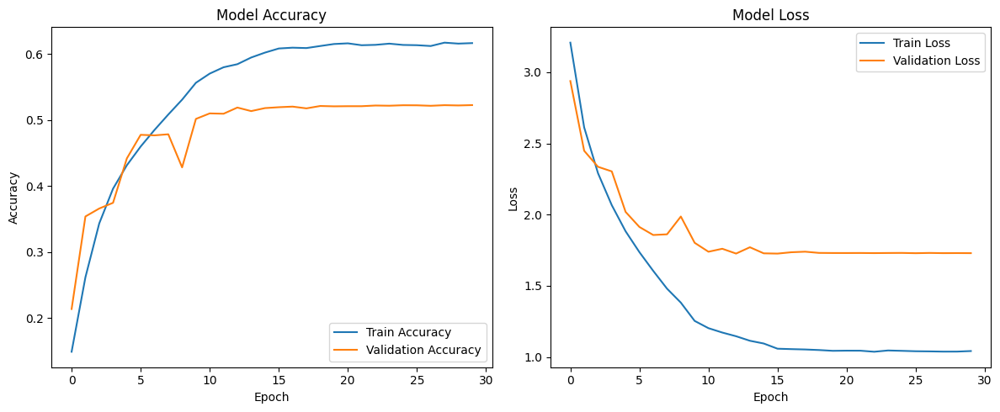

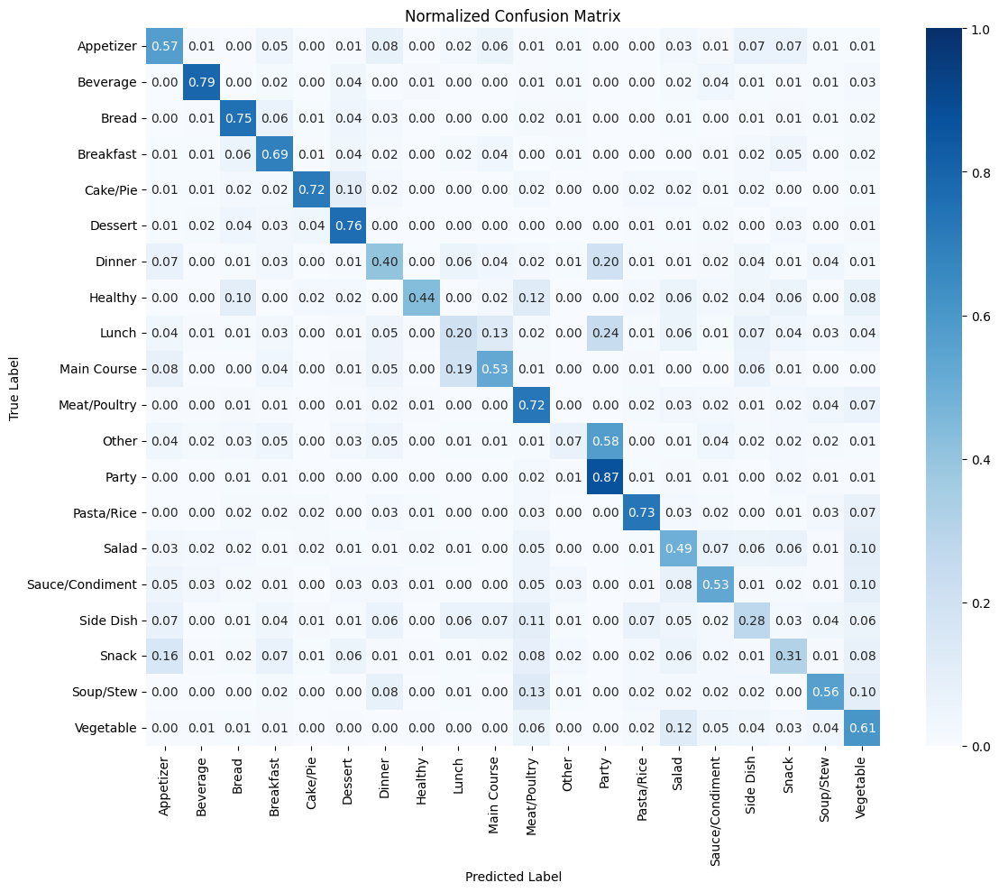

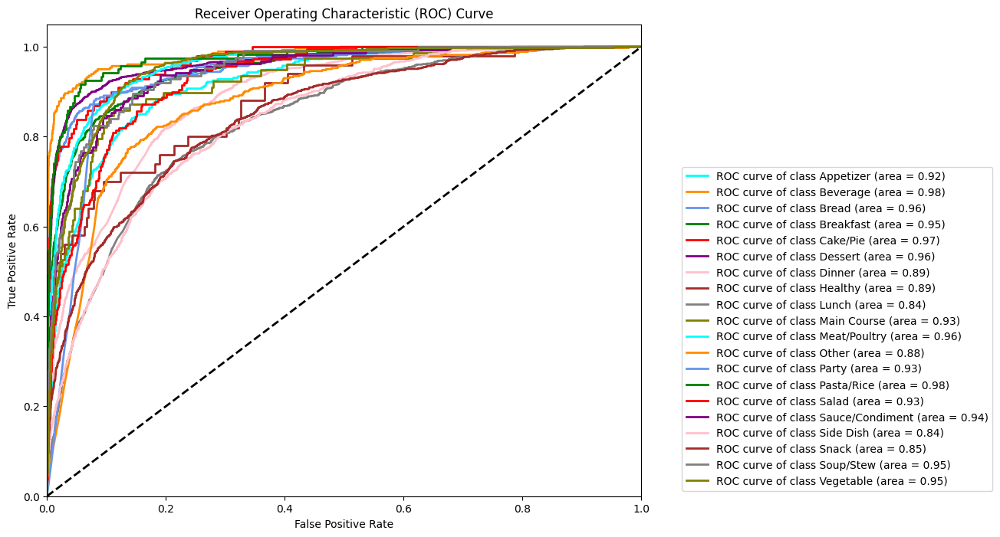

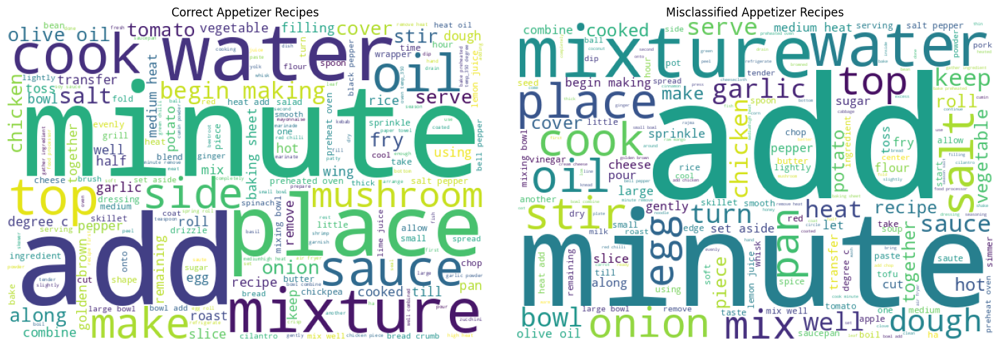

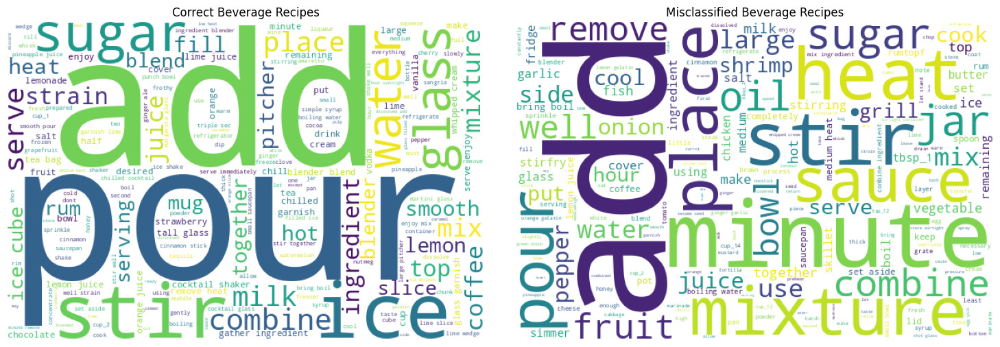

...

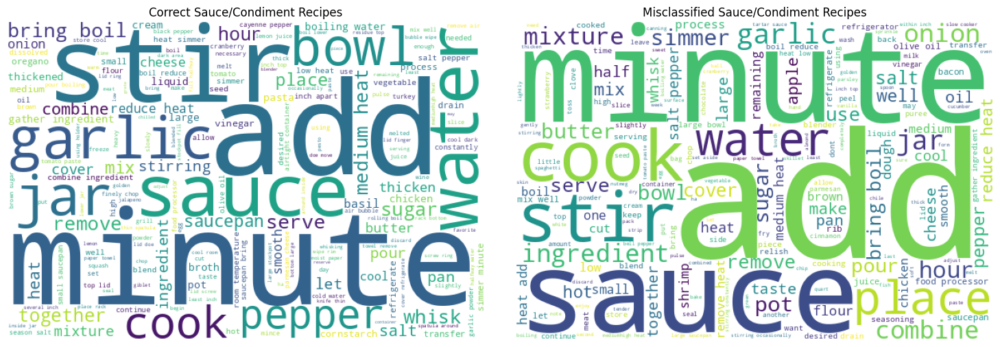

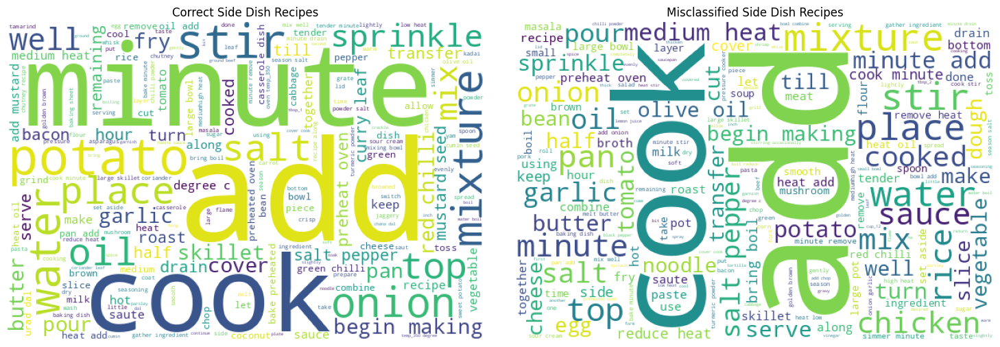

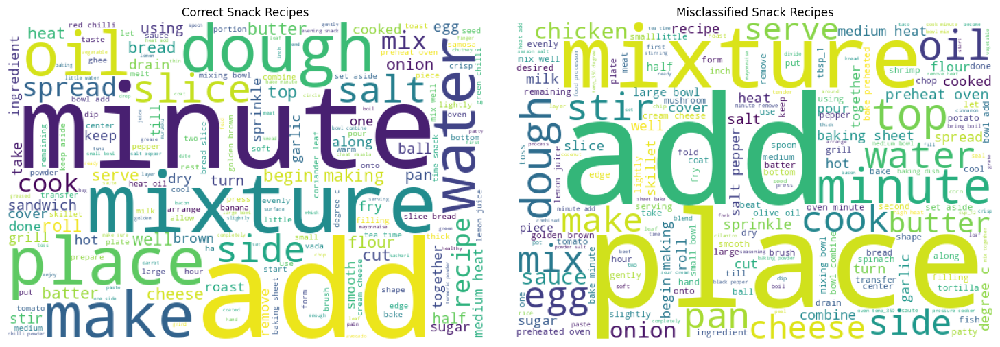

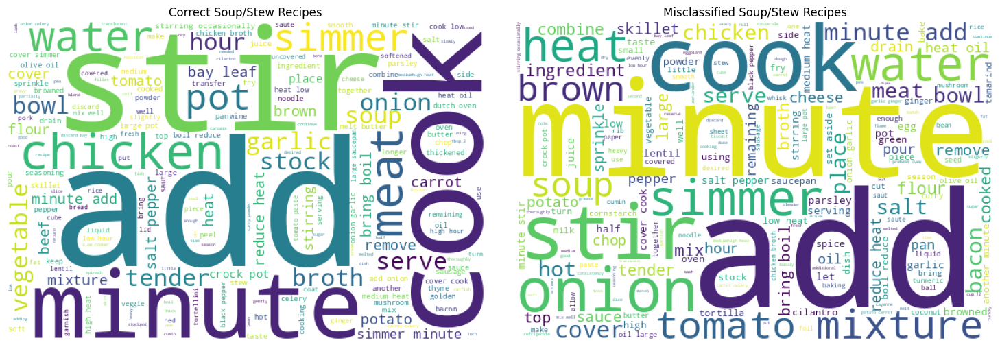

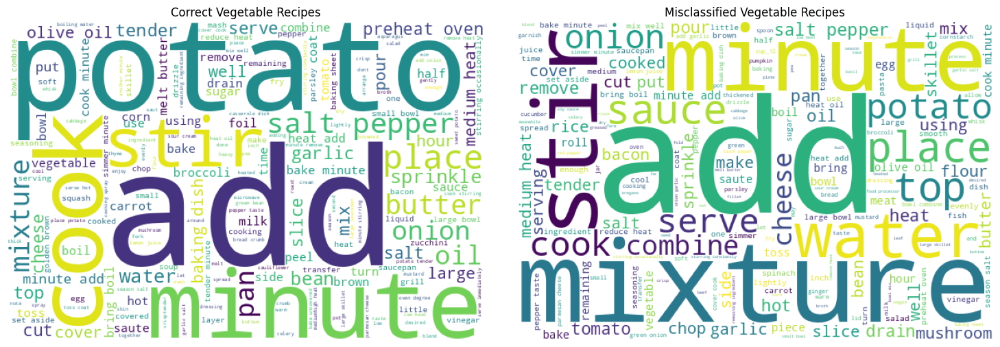

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
from itertools import cycle
from wordcloud import WordCloud

# After training your model, add these visualization functions:

def plot_training_history(history):
    """Plot training and validation accuracy and loss"""
    plt.figure(figsize=(12, 5))

    # Accuracy plot
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Model Accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend()

    # Loss plot
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Model Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend()

    plt.tight_layout()
    plt.show()

def plot_confusion_matrix_custom(y_true, y_pred, classes):
    """Create a custom confusion matrix plot"""
    cm = confusion_matrix(y_true, y_pred)
    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(12, 10))
    sns.heatmap(cm_normalized, annot=True, fmt='.2f',
                xticklabels=classes, yticklabels=classes,
                cmap='Blues', vmin=0, vmax=1)
    plt.title('Normalized Confusion Matrix')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.xticks(rotation=90)
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()

def plot_roc_curve_custom(y_true, y_pred_probs, classes):
    """Create multi-class ROC curves"""
    # Binarize the output
    y_true_bin = label_binarize(y_true, classes=np.arange(len(classes)))

    # Compute ROC curve and ROC area for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(len(classes)):
        fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_pred_probs[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Plot all ROC curves
    plt.figure(figsize=(10, 8))
    colors = cycle(['aqua', 'darkorange', 'cornflowerblue', 'green', 'red',
                   'purple', 'pink', 'brown', 'gray', 'olive'])
    for i, color in zip(range(len(classes)), colors):
        plt.plot(fpr[i], tpr[i], color=color, lw=2,
                 label='ROC curve of class {0} (area = {1:0.2f})'
                 ''.format(classes[i], roc_auc[i]))

    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend(loc="lower right", bbox_to_anchor=(1.6, 0))
    plt.show()

def generate_word_clouds(results_df, classes):
    """Generate word clouds for correctly and incorrectly classified samples"""
    # Create a dataframe with the results
    results_df['correct'] = results_df['true_label'] == results_df['pred_label']

    # Plot word clouds for each class
    for class_idx, class_name in enumerate(classes):
        plt.figure(figsize=(15, 5))

        # Correct predictions
        plt.subplot(1, 2, 1)
        correct_text = " ".join(results_df[(results_df['true_label'] == class_idx) &
                                         (results_df['correct'])]['text'])
        if correct_text.strip():
            wordcloud = WordCloud(width=600, height=400, background_color='white').generate(correct_text)
            plt.imshow(wordcloud)
            plt.title(f'Correct {class_name} Recipes')
        else:
            plt.text(0.5, 0.5, 'No correct predictions', ha='center')
        plt.axis("off")

        # Incorrect predictions
        plt.subplot(1, 2, 2)
        incorrect_text = " ".join(results_df[(results_df['true_label'] == class_idx) &
                                           (~results_df['correct'])]['text'])
        if incorrect_text.strip():
            wordcloud = WordCloud(width=600, height=400, background_color='white').generate(incorrect_text)
            plt.imshow(wordcloud)
            plt.title(f'Misclassified {class_name} Recipes')
        else:
            plt.text(0.5, 0.5, 'No misclassifications', ha='center')
        plt.axis("off")
        plt.tight_layout()
        plt.show()

def evaluate_model_complete(model, X_test_seq, X_test_len, y_test, test_texts, classes):
    """Complete model evaluation with visualizations"""
    # Get predictions
    y_pred_probs = model.predict({'sequence_input': X_test_seq, 'length_input': X_test_len})
    y_pred_classes = np.argmax(y_pred_probs, axis=1)

    if isinstance(test_texts, np.ndarray):
        test_texts = list(test_texts)

    # Create results dataframe safely
    results_df = pd.DataFrame({
        'text': test_texts,
        'true_label': y_test,
        'pred_label': y_pred_classes
    })

    # 1. Classification report
    print("\nClassification Report:")
    print(classification_report(y_test, y_pred_classes, target_names=classes))

    # 2. Training history
    plot_training_history(history)

    # 3. Confusion matrix
    plot_confusion_matrix_custom(y_test, y_pred_classes, classes)

    # 4. ROC curves
    plot_roc_curve_custom(y_test, y_pred_probs, classes)

    # 5. Word clouds
    generate_word_clouds(results_df, classes)

    return y_pred_probs, y_pred_classes

indices = np.arange(len(df))
train_idx, test_idx = train_test_split(
    indices,
    test_size=0.2,
    random_state=42,
    stratify=y
)

# 2. Now create your data splits using these indices
X_train_seq, X_test_seq = padded_sequences[train_idx], padded_sequences[test_idx]
X_train_len, X_test_len = length_features[train_idx], length_features[test_idx]
y_train, y_test = y[train_idx], y[test_idx]

# 3. Get the corresponding text data
test_texts = df.iloc[test_idx]['cleaned_instructions'].values

# Run the complete evaluation
class_names = label_encoder.classes_
y_pred_probs, y_pred_classes = evaluate_model_complete(
    model,
    X_test_seq,
    X_test_len,
    y_test,
    test_texts,  # Get the original test samples
    class_names
)

In [ ]:
!pip install scikit-plot
!pip install wordcloud